# Desafío Kaggle: Detección de Posiciones de Yoga 

<span class="mark">Integrantes:</span> Mario Mallea, Maximiliano Ramírez, Hugo rocha.

<span class="mark">Equipo:</span> Juan Banach



# Librerías

In [ ]:
#librerias
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import cv2
from google.colab.patches import cv2_imshow
import math
import numpy as np

import missingno as msno 
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold

# Import necessary modules
from sklearn.metrics import mean_squared_error

# Keras specific
import keras
from keras.models import Sequential
from keras.layers import Dense

from keras.models import Sequential
from keras.layers.normalization import BatchNormalization
from keras.layers.convolutional import Conv2D
from keras.layers.convolutional import MaxPooling2D
from keras.layers.core import Activation
from keras.layers.core import Dropout
from keras.layers.core import Dense
from keras.layers import Flatten
from keras.layers import Input
from keras.models import Model
from keras.callbacks import ModelCheckpoint
from tensorflow.keras import layers
from keras.callbacks import History,EarlyStopping
from tensorflow.keras.regularizers import L1, L2, L1L2

from sklearn.metrics import classification_report

import tensorflow as tf
#import tensorflow_addons as tfa
from tensorflow import keras
import pydot



#help(mp_pose.Pose)


from numpy.random import seed
import random as python_random
import random

import warnings
warnings.filterwarnings("ignore")

import glob
import cv2
import os
import matplotlib.image as mpimg
import matplotlib.gridspec as gridspec
import matplotlib.image as mpimg
from PIL import Image
 
from sklearn.metrics import f1_score
seed(48)
python_random.seed(48)
tf.random.set_seed(48)

from sklearn.utils import resample

In [ ]:
# hacer la conexión a Google Drive

from google.colab import drive

colab_flag = True

if (colab_flag):
    drive.mount('/content/drive',force_remount=True)



path = '/content/drive/MyDrive/ANN-2021-I/'


Mounted at /content/drive


# Esqueletos

Fuente: 

https://google.github.io/mediapipe/solutions/pose.html

In [ ]:
from IPython.display import Image
Image(url='https://google.github.io/mediapipe/images/mobile/pose_tracking_example.gif')

In [ ]:
!pip install mediapipe

import mediapipe as mp
mp_pose = mp.solutions.pose
mp_drawing = mp.solutions.drawing_utils 

     |████████████████████████████████| 32.2MB 99kB/s 


In [ ]:
def esqueleto(image):
  images=[("a",image)]
  # Run MediaPipe Pose and draw pose landmarks.
  with mp_pose.Pose(
      static_image_mode=True, min_detection_confidence=0.5, model_complexity=2) as pose:
    for name, image in images:
      # Convert the BGR image to RGB and process it with MediaPipe Pose.
      results = pose.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
      
      # Print nose landmark.
      image_hight, image_width, _ = image.shape
      if not results.pose_landmarks:
        continue
      # Draw pose landmarks.
      annotated_image = image.copy()
      mp_drawing.draw_landmarks(
          image=annotated_image,
          landmark_list=results.pose_landmarks,
          connections=mp_pose.POSE_CONNECTIONS)
    return annotated_image

#Lectura con preprocesamiento

In [ ]:
train= open(path+'Yoga-Dataset/yoga_train.txt','r')
train= train.read()

In [ ]:
df= pd.DataFrame(columns=["imagen","superclase","subclase","combinacion"])
c=0
for tupla in train.split("\n")[:-1]:
    im=tupla.split(",")[0]
    superc,subc=tupla.split(",")[1].split()
    df.loc[c]=[im,int(superc),int(subc), superc+"."+subc ]
    c+=1
    
    

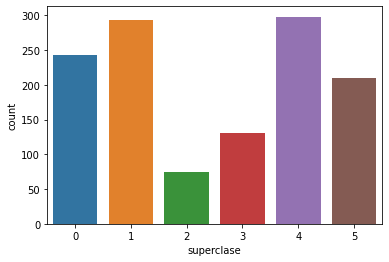

In [ ]:
sns.countplot(x="superclase", data=df)

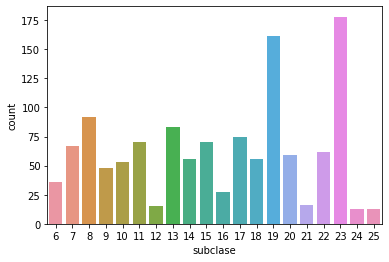

In [ ]:
sns.countplot(x="subclase", data=df)

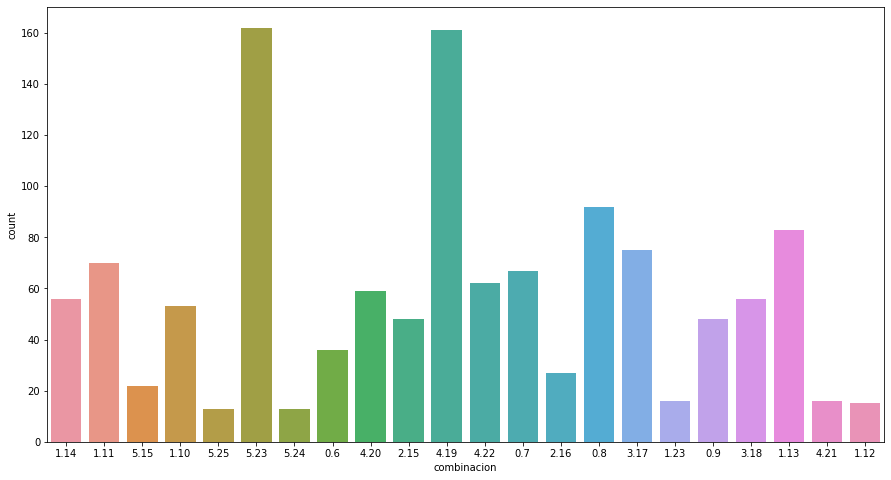

In [ ]:
plt.figure(figsize=(15,8))
sns.countplot(x="combinacion", data=df)

Notar que para cada una de las 6 super clases tenemos subclases particulares :

    0- 6,7,8,9
    1- 10,11,12,13,14
    2- 15,16
    3- 17,18
    4- 19,20,21,22
    5- 23,24,25

In [ ]:
def cargar_imagenes(df):
        #ojo con la forma que requiere el df
    inputImages = []
    tamaño=224
    for i in range(df.shape[0]):
        nombre= df.imagen[i]
        try:
            image = cv2.imread(path+"Yoga-Dataset/Images/"+ nombre)
            image=esqueleto(image)
            image = cv2.resize(image, (tamaño, tamaño)) #fijar tamaño
            image=np.array(image)
            image = image.astype('float32')
            image = image/255 # escalar a [0, 1] 
            #############
            #############
            inputImages.append(image)

        
        except:
            image = mpimg.imread(path+"Yoga-Dataset/Images/"+ nombre)
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            image = cv2.resize(image, (tamaño, tamaño)) #fijar tamaño
            image=np.array(image)
            image = image.astype('float32')
            image = image/255 # escalar a [0, 1]
            inputImages.append(image)     
            pass
   
    return inputImages
    


In [ ]:
Imagenes=cargar_imagenes(df)

In [ ]:
len(Imagenes)

1250

Estas son nuestras imágenes:

(-0.5, 223.5, 223.5, -0.5)

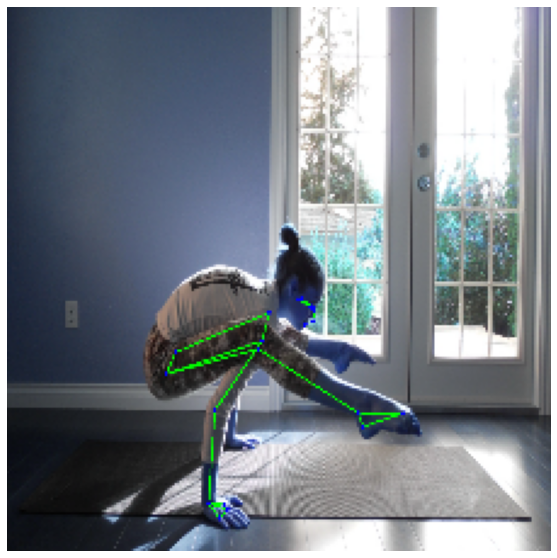

In [ ]:
image = tf.expand_dims(Imagenes[300], 0)
plt.figure(figsize=(10, 10))

plt.imshow(image[0])
plt.axis("off")

Parición estratificada

In [ ]:
y =  pd.get_dummies(df['combinacion'])
#y=pd.get_dummies(y)
X = np.array(Imagenes)  #Imagenes_aumentadas # Para probar el data aumentation

# Split de los ejemplos de entrenamiento
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=0, stratify = y)


print("X,y Shapes:", X.shape, y.shape)
print("X,y Train Shapes:", X_train.shape, y_train.shape)
print("X,y Val Shapes:", X_val.shape, y_val.shape)

#y_val=y_val.idxmax(axis=1)
y_val_2= pd.get_dummies(y_val)

X,y Shapes: (1250, 224, 224, 3) (1250, 22)
X,y Train Shapes: (1000, 224, 224, 3) (1000, 22)
X,y Val Shapes: (250, 224, 224, 3) (250, 22)


# Modelo

Dense net 201

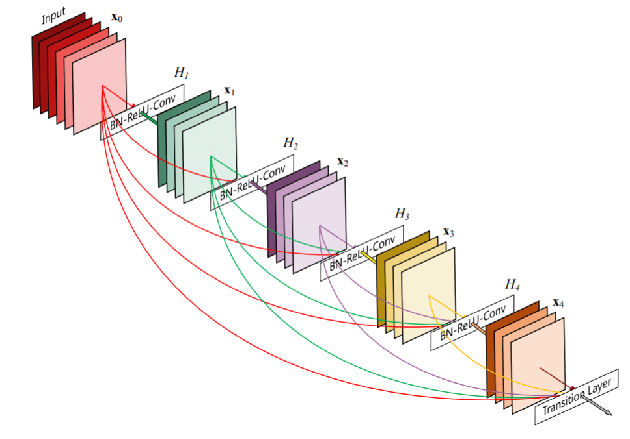

In [ ]:

base_model  = tf.keras.applications.DenseNet201(input_shape=(224,224,3),include_top=False, weights='imagenet') # cargamos con pesos entrenados en ImageNet

base_model.trainable = False

base_model.summary()

Model: "densenet201"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_22 (InputLayer)           [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
zero_padding2d_20 (ZeroPadding2 (None, 230, 230, 3)  0           input_22[0][0]                   
__________________________________________________________________________________________________
conv1/conv (Conv2D)             (None, 112, 112, 64) 9408        zero_padding2d_20[0][0]          
__________________________________________________________________________________________________
conv1/bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1/conv[0][0]                 
________________________________________________________________________________________

In [ ]:
inputs = keras.Input(shape=(224, 224, 3))

x = base_model(inputs, training=False)
x = keras.layers.GlobalAveragePooling2D()(x)

x = layers.Dense(256, activation='relu', activity_regularizer=L2(0.001))(x) 
x= tf.keras.layers.Dropout(0.2)(x)
x = layers.Dense(128, activation='relu', activity_regularizer=L2(0.001))(x)
x= tf.keras.layers.Dropout(0.2)(x)
output = layers.Dense(22, activation='softmax', name='MyOutput')(x)
model = keras.Model(inputs=inputs, outputs=output, name='Second_FF')
model.summary()


Model: "Second_FF"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_23 (InputLayer)        [(None, 224, 224, 3)]     0         
_________________________________________________________________
densenet201 (Functional)     (None, 7, 7, 1920)        18321984  
_________________________________________________________________
global_average_pooling2d_11  (None, 1920)              0         
_________________________________________________________________
dense_22 (Dense)             (None, 256)               491776    
_________________________________________________________________
dropout_22 (Dropout)         (None, 256)               0         
_________________________________________________________________
dense_23 (Dense)             (None, 128)               32896     
_________________________________________________________________
dropout_23 (Dropout)         (None, 128)               0 

In [ ]:
feature_flag = True

if (feature_flag):
    _batch_size = 32 
    epocas= 22 #100 #test
    my_callbacks = [History(), EarlyStopping(patience=10, monitor="val_loss",restore_best_weights=True)]
    model.compile( loss=tf.keras.losses.CategoricalCrossentropy(),optimizer = tf.keras.optimizers.Adam(), metrics=['accuracy'])

    # Entrenar modelo
    history = model.fit(
        x = X_train, #X_train
        y = y_train, #y_train
        batch_size=_batch_size,
        epochs= epocas,
        verbose=2,
        validation_data=(X_val,y_val_2),  callbacks= my_callbacks
    )
    epocas= len(history.history['accuracy'])
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']

    loss = history.history['loss']
    val_loss = history.history['val_loss']

Epoch 1/22
32/32 - 19s - loss: 3.0214 - accuracy: 0.1590 - val_loss: 2.7384 - val_accuracy: 0.2320
Epoch 2/22
32/32 - 6s - loss: 2.5932 - accuracy: 0.2830 - val_loss: 2.4771 - val_accuracy: 0.3280
Epoch 3/22
32/32 - 6s - loss: 2.2147 - accuracy: 0.3820 - val_loss: 2.2417 - val_accuracy: 0.3640
Epoch 4/22
32/32 - 6s - loss: 1.9351 - accuracy: 0.4550 - val_loss: 2.0733 - val_accuracy: 0.4400
Epoch 5/22
32/32 - 6s - loss: 1.6977 - accuracy: 0.5270 - val_loss: 1.9553 - val_accuracy: 0.4440
Epoch 6/22
32/32 - 6s - loss: 1.4867 - accuracy: 0.6190 - val_loss: 1.8766 - val_accuracy: 0.4360
Epoch 7/22
32/32 - 6s - loss: 1.2517 - accuracy: 0.6800 - val_loss: 1.8806 - val_accuracy: 0.4760
Epoch 8/22
32/32 - 6s - loss: 1.0792 - accuracy: 0.7320 - val_loss: 1.8020 - val_accuracy: 0.4960
Epoch 9/22
32/32 - 6s - loss: 0.9430 - accuracy: 0.7720 - val_loss: 1.7760 - val_accuracy: 0.4880
Epoch 10/22
32/32 - 6s - loss: 0.7883 - accuracy: 0.8240 - val_loss: 1.8074 - val_accuracy: 0.5040
Epoch 11/22
32/32 

In [ ]:
ypred=model.predict(X_val)
y_val_real=[]
for i in df.iloc[y_val_2.index].combinacion.values:
      y_val_real.append(list(y_val_2.columns).index(i))

y_pred = np.argmax(ypred, axis=1)

f1_score(y_val_real, y_pred, average='macro')

0.409080759835825

Fine Tuning:

In [ ]:
base_model.trainable = True

# Let's take a look to see how many layers are in the base model
print("Number of layers in the base model: ", len(base_model.layers))

# Fine-tune from this layer onwards
fine_tune_at = 52 #107

# Freeze all the layers before the `fine_tune_at` layer
for layer in base_model.layers[:fine_tune_at]:
  layer.trainable =  False

Number of layers in the base model:  707


In [ ]:
model.compile(loss='categorical_crossentropy',
              optimizer = tf.keras.optimizers.Adam(lr=0.001/10),
              metrics=['accuracy'])

In [ ]:
fine_tune_epochs = 50
total_epochs =  epocas + fine_tune_epochs
#total_epochs = 22+14 #test
my_callbacks = [History(), EarlyStopping(patience=5, monitor="val_loss",restore_best_weights=True)]

history_fine = model.fit(x = X_train, y = y_train, batch_size=_batch_size, #y_train
                         epochs=total_epochs,
                         initial_epoch=history.epoch[-1],
                         validation_data=(X_val,y_val_2), callbacks= my_callbacks
                         )
                         

Epoch 22/72
32/32 [==============================] - 36s 617ms/step - loss: 1.8576 - accuracy: 0.4890 - val_loss: 1.6376 - val_accuracy: 0.5480
Epoch 23/72
32/32 [==============================] - 16s 492ms/step - loss: 1.0607 - accuracy: 0.6960 - val_loss: 1.3143 - val_accuracy: 0.6280
Epoch 24/72
32/32 [==============================] - 16s 499ms/step - loss: 0.5212 - accuracy: 0.8860 - val_loss: 1.4834 - val_accuracy: 0.6040
Epoch 25/72
32/32 [==============================] - 16s 495ms/step - loss: 0.4514 - accuracy: 0.9060 - val_loss: 1.2211 - val_accuracy: 0.6400
Epoch 26/72
32/32 [==============================] - 16s 497ms/step - loss: 0.2987 - accuracy: 0.9630 - val_loss: 1.2863 - val_accuracy: 0.6560
Epoch 27/72
32/32 [==============================] - 16s 497ms/step - loss: 0.2276 - accuracy: 0.9760 - val_loss: 1.0958 - val_accuracy: 0.6920
Epoch 28/72
32/32 [==============================] - 16s 497ms/step - loss: 0.2011 - accuracy: 0.9920 - val_loss: 1.1080 - val_accuracy:

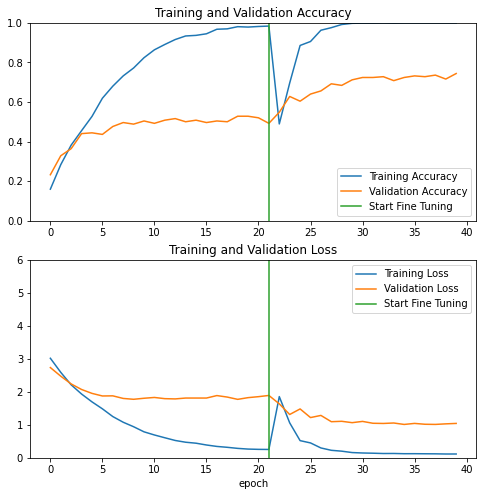

In [ ]:
acc += history_fine.history['accuracy']
val_acc += history_fine.history['val_accuracy']

loss += history_fine.history['loss']
val_loss += history_fine.history['val_loss']
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.ylim([0, 1])
plt.plot([epocas-1,epocas-1],
          plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.ylim([0, 6])
plt.plot([epocas-1,epocas-1],
         plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [ ]:
ypred=model.predict(X_val)
y_val_real=[]
for i in df.iloc[y_val_2.index].combinacion.values:
#for i in y2[y_val.index]:
      y_val_real.append(list(y_val_2.columns).index(i))

y_pred = np.argmax(ypred, axis=1)

f1_score(y_val_real, y_pred, average='macro')

0.6666355556942304

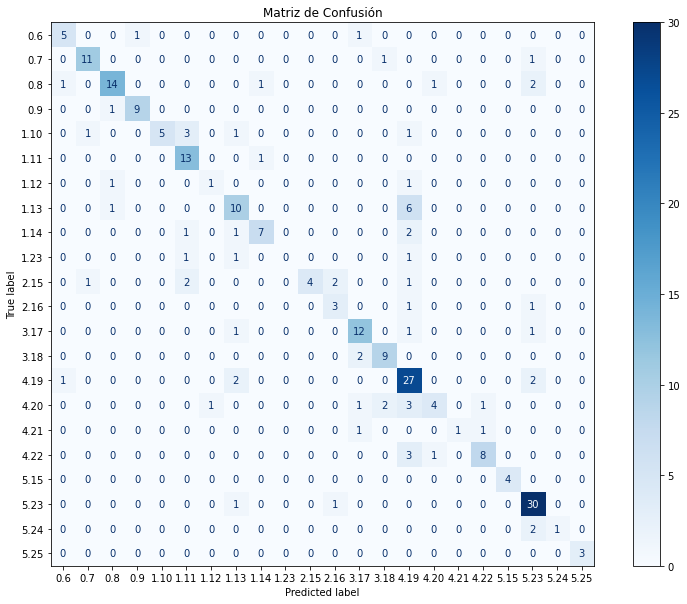

In [ ]:
clases=[y_train.columns[i] for i in range(22)]
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
fig, ax = plt.subplots(figsize=(14, 10))
cm = confusion_matrix(y_val_real, y_pred, labels=range(22))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=clases)
disp.plot(cmap=plt.cm.Blues,ax=ax)
ax.set_title('Matriz de Confusión')
ax.grid(False) 
plt.show()

### Filtros

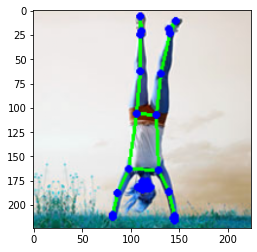

In [ ]:
image = tf.expand_dims(X_train[8], 0)
plt.imshow(image[0])


(1, 28, 28, 128)


IndexError: ignored

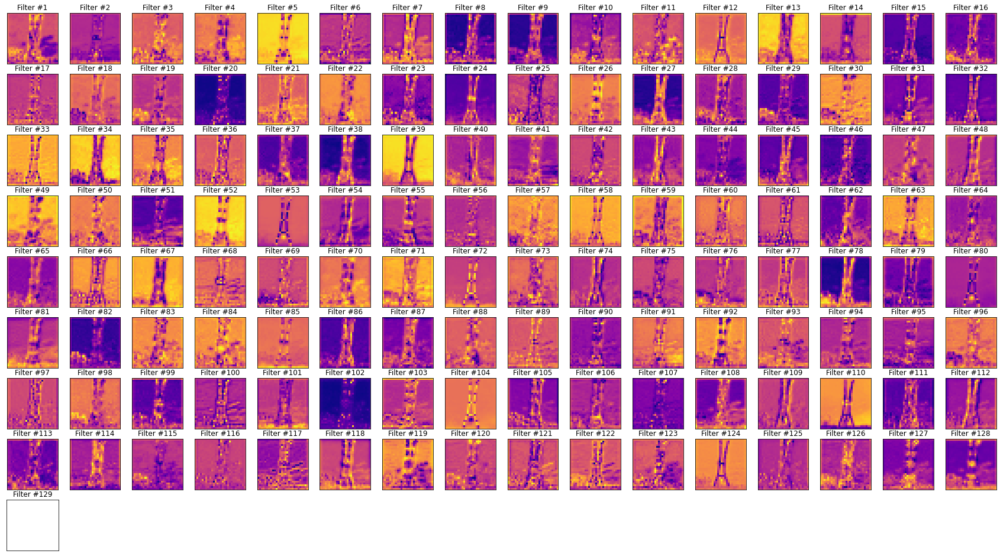

In [ ]:
#segundo bloque=52 -> 128 filtros

model3= model3 = keras.Model(inputs=base_model.inputs, outputs = base_model.layers[52].output)
feature_maps = model3.predict(image) # predict usando esa imagen

print(feature_maps.shape)

# graficar la accion de los 64 filtros 

fig = plt.figure(figsize=(30, 30))

square = 16
ix = 1
for i in range(square):
    for j in range(square):
        
        ax = plt.subplot(square, square, ix)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_yticks([])
        ax.title.set_text("Filter #{0}".format( i*square + (j+1)) )
        plt.imshow(feature_maps[0, :, :, ix-1], cmap='plasma')
        ix += 1

plt.show()

(1, 56, 56, 128)


IndexError: ignored

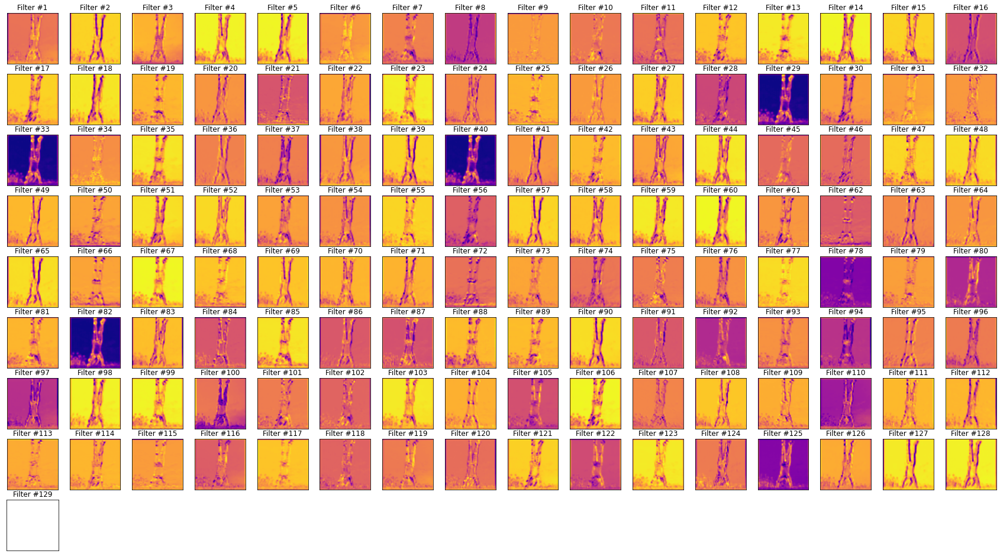

In [ ]:
#segundo bloque=52 -> 128 filtros

model3= model3 = keras.Model(inputs=base_model.inputs, outputs = base_model.layers[10].output)
feature_maps = model3.predict(image) # predict usando esa imagen

print(feature_maps.shape)

# graficar la accion de los 64 filtros 

fig = plt.figure(figsize=(30, 30))

square = 16
ix = 1
for i in range(square):
    for j in range(square):
        
        ax = plt.subplot(square, square, ix)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_yticks([])
        ax.title.set_text("Filter #{0}".format( i*square + (j+1)) )
        plt.imshow(feature_maps[0, :, :, ix-1], cmap='plasma')
        ix += 1

plt.show()

### Resultados en validación de diferentes ideas

  **Validación- Test Kaggle**

Esqueleto  ->  69% - 71%



Esqueleto + [2do bloque conv:] (fine tunning)  ->  67% - 75%

SVD y sin solo  ->  62% - 54%

Esqueleto + data augmentation + [2do bloque conv:] (fine tunning) -> 64%- 69% 

solo desde [2do bloque conv:] (fine tunning) -> 69%-

# Evaluación

In [ ]:
test= open(path+'Yoga-Dataset/yoga_test.txt','r')
test= test.read()

In [ ]:
df_test= pd.DataFrame(columns=["imagen"])
c=0
for tupla in test.split("\n")[:-1]:
    im=tupla.split(",")[0]
    df_test.loc[c]=[im]
    c+=1

In [ ]:
df_test

,imagen
0,1400.jpg
1,1402.jpg
2,1403.jpg
3,1404.jpg
4,1405.jpg
...,...
373,1894.jpg
374,1896.jpg
375,1897.jpg
376,1898.jpg


In [ ]:
Imagenes_=cargar_imagenes(df_test)
X_test= np.array(Imagenes_)  #Imagenes_aumentadas #

In [ ]:
ypred=model.predict(X_test)
y_pred = np.argmax(ypred, axis=1)

In [ ]:
y_final=[]
for i in range(y_pred.shape[0]):
      respuesta= y_train.columns[y_pred[i]]
      y_final.append((df_test.imagen[i],y_train.columns[y_pred[i]].replace("."," ")))

In [ ]:
def vector(listatupla):
    summit=pd.DataFrame(listatupla)
    summit.columns=["'id'","'classes'"]
    summit=summit.set_index("'id'")
    return summit

In [ ]:
respuesta= vector(y_final) 

In [ ]:
respuesta

,'classes'
'id',
1400.jpg,4 19
1402.jpg,0 6
1403.jpg,0 9
1404.jpg,0 6
1405.jpg,0 8
...,...
1894.jpg,5 23
1896.jpg,3 17
1897.jpg,1 10


In [ ]:
respuesta.to_csv("sampleSubmission_1.csv")
from google.colab import files

files.download("sampleSubmission_1.csv")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Apéndice de ideas

## Data Augmentation

In [ ]:
## Cantidad de imagenes que le faltan a la clase

#df_2 = df #test
df_2 = df.iloc[y_train.index].reset_index() #validación

max = df_2['combinacion'].value_counts().max()/2

dic = {}
lista= df_2['combinacion'].value_counts()

for i in range(len(lista.index)):

  division = max//lista[i]
  resto = int(max%lista[i])
  if division-1 <0:
    division=1
  
  dic[lista.index[i]] = (int(division-1), resto )

In [ ]:
dic

{'0.6': (1, 9),
 '0.7': (0, 14),
 '0.8': (0, 81),
 '0.9': (0, 33),
 '1.10': (0, 28),
 '1.11': (0, 11),
 '1.12': (4, 6),
 '1.13': (0, 81),
 '1.14': (0, 25),
 '1.23': (4, 1),
 '2.15': (0, 33),
 '2.16': (2, 0),
 '3.17': (0, 6),
 '3.18': (0, 25),
 '4.19': (0, 81),
 '4.20': (0, 22),
 '4.21': (4, 1),
 '4.22': (0, 19),
 '5.15': (2, 15),
 '5.23': (0, 81),
 '5.24': (5, 3),
 '5.25': (5, 3)}

Expandemos las etiquetas según el diccionario

In [ ]:
#y_train = y #test

clases = list(dic.keys()) 

y_train = list(y_train.idxmax(axis=1))

for clase in clases: 
  n_rot, rot_solas = dic[clase]
  im=len(df_2[df_2['combinacion']==clase].index)
  for j in range(rot_solas):
      y_train=y_train+[clase]
  for i in range(n_rot*im):
     y_train=y_train+[clase]

y_train =  pd.get_dummies(y_train)

In [ ]:
def n_zoom(imagen, n_rot):
  
  imagen=tf.expand_dims(imagen, 0)
  n=2
  if n_rot == 1:
    n = 1

  for i in range(n_rot):
    n_v=29+n
    y = tf.keras.layers.Cropping2D(cropping=((n_v, n_v), (n_v, n_v)))(imagen) #(,)-vertical (,)- horizontal  
    y = cv2.resize(np.array(y)[0], (224, 224))
    sub_img=tf.expand_dims(y, 0)

    if i==0:
      n+=1
      arr=np.array(sub_img)
    else:
      n+=1
      arr=np.concatenate((arr, sub_img),axis=0)

  return arr

In [ ]:
def zoom(X_train):
  c=0
  for clase in clases:
    n_rot, rot_solas = dic[clase]
    im = df_2[df_2['combinacion']==clase].index
    im_solas=im[:rot_solas]
    #Rotaciones Solas
    for j in im_solas:
      imagen = X_train[j]
      if c == 0:
        X_train_aumentado = n_zoom(imagen,1)
        c=1
      else:
        X_train_aumentado=np.concatenate((X_train_aumentado, n_zoom(imagen,1)),axis=0)
    for i in im:
      if n_rot != 0:
        imagen= X_train[i]
        X_train_aumentado=np.concatenate((X_train_aumentado, n_zoom(imagen, n_rot)),axis=0)

  return X_train_aumentado

In [ ]:
#X_train_aumentado = np.concatenate((X, zoom(X)), axis=0) #test
X_train_aumentado = np.concatenate((X_train, zoom(X_train)), axis=0) #validacion
print("dimensiones: X", X_train_aumentado.shape ,", y ", y_train.shape)

dimensiones: X (1828, 224, 224, 3) , y  (1828, 22)


después:

In [ ]:
data_balanceado= pd.DataFrame(columns=["indice", "combinación"])
data_balanceado["indice"]=range(len(y_train.idxmax(axis=1)))
data_balanceado["combinación"] =y_train.idxmax(axis=1)

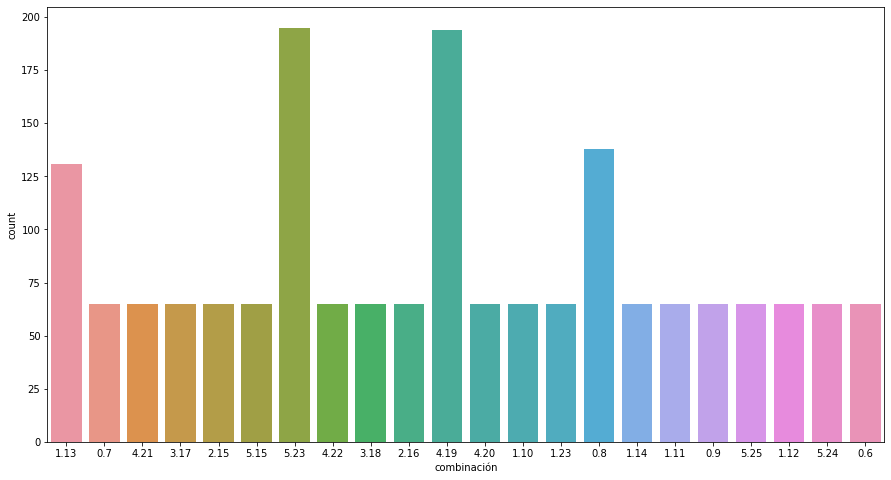

In [ ]:
plt.figure(figsize=(15,8))
sns.countplot(x="combinación" ,data= data_balanceado)

Ejemplos:

(-0.5, 223.5, 223.5, -0.5)

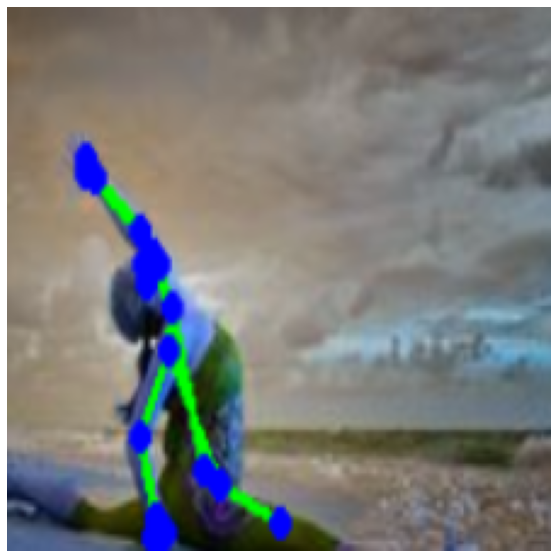

In [ ]:
image = tf.expand_dims(X_train_aumentado[1816], 0)
plt.figure(figsize=(10, 10))

plt.imshow(image[0])
plt.axis("off")

## SVD

Intuición: Aplicar aproximaciones de rango bajo (1) a cada canal RGB para tener una imagen aproximada que elimina patrones innecesarios de la imagen original

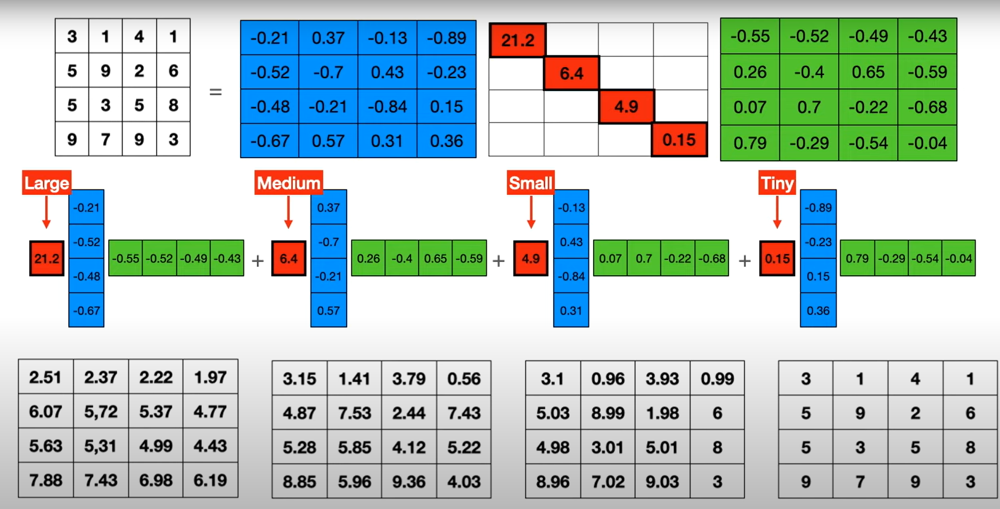

In [ ]:
from numpy.linalg import svd

def aprox_svd(imagen_matrix):
  svd_canales=[]
  svd_aprox_rango_bajo_acumulada=[]
  aproximaciones=20
  n=224
  for i in range(3):
    U, S, V = svd(imagen_matrix[:,:,i])
    svd_canales.append((U,S,V))
    combined_imgs = []
    imgs = []
    for i in range(aproximaciones):
        imgs.append(S[i]*np.outer(U[:,i],V[i])) #aprox de rango 1
        img = sum(imgs[:i+1]) #sumamos acumulando
        combined_imgs.append(img) #agregamos las suma sucesivas      
    svd_aprox_rango_bajo_acumulada.append(combined_imgs)  

  i=aproximaciones-1
  return np.dstack( (svd_aprox_rango_bajo_acumulada[0][i],  svd_aprox_rango_bajo_acumulada[1][i], svd_aprox_rango_bajo_acumulada[2][i]) )

Ejemplo con aproximaciones considerando los primeros 20 valores singulares

In [ ]:

aproximaciones= 20
imagen_matrix= X[10]
svd_canales=[]
svd_aprox_rango_bajo_acumulada=[]
svd_aprox_rango_bajo= []
n=224
for i in range(3):
  
  U, S, V = svd(imagen_matrix[:,:,i])
  svd_canales.append((U,S,V))
  imgs = []
  for i in range(aproximaciones):
      imgs.append(S[i]*np.outer(U[:,i],V[i])) #aprox de rango 1
  svd_aprox_rango_bajo.append(imgs)
  combined_imgs = []
  for i in range(aproximaciones):
      #print("valor singular: ",S[i])
      img = sum(imgs[:i+1]) #sumamos acumulando
      combined_imgs.append(img) #agregamos las suma sucesivas      
  svd_aprox_rango_bajo_acumulada.append(combined_imgs)
  

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

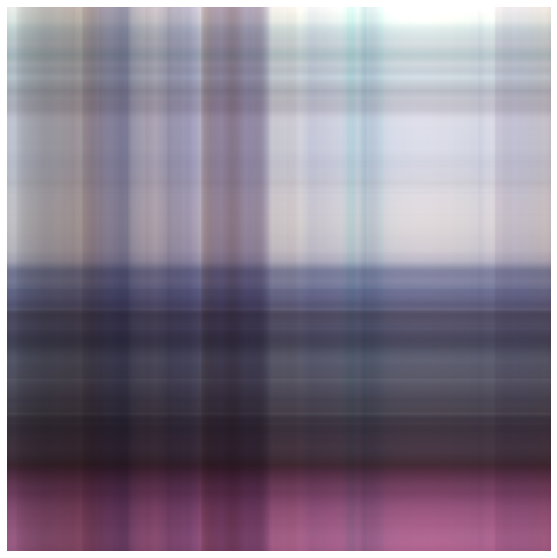

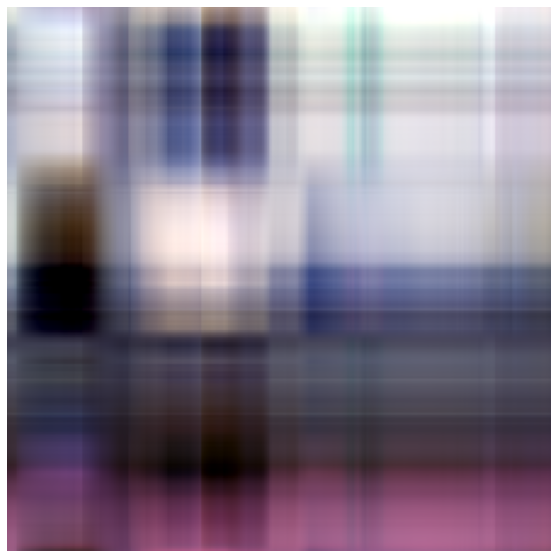

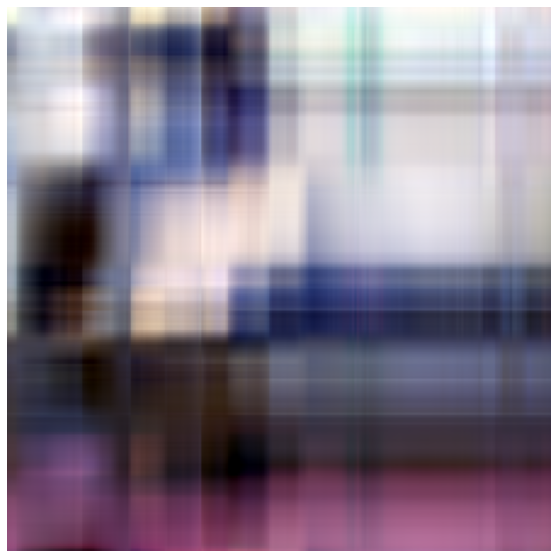

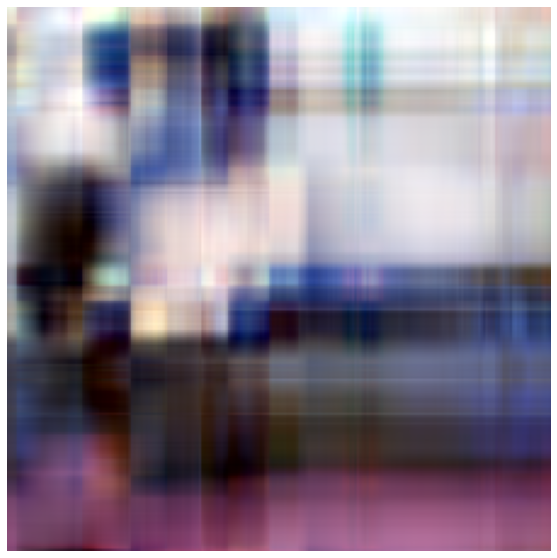

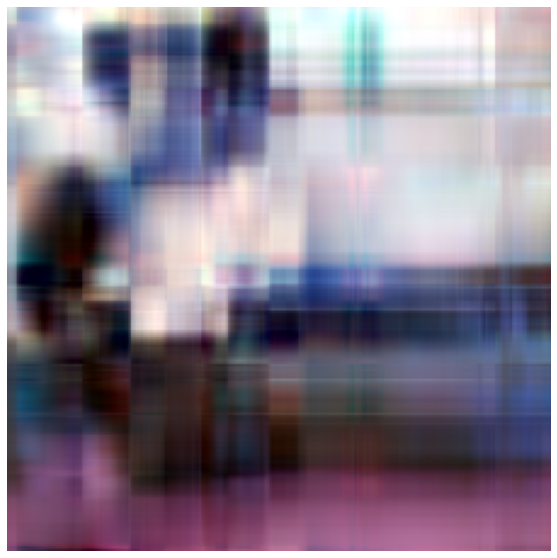

...

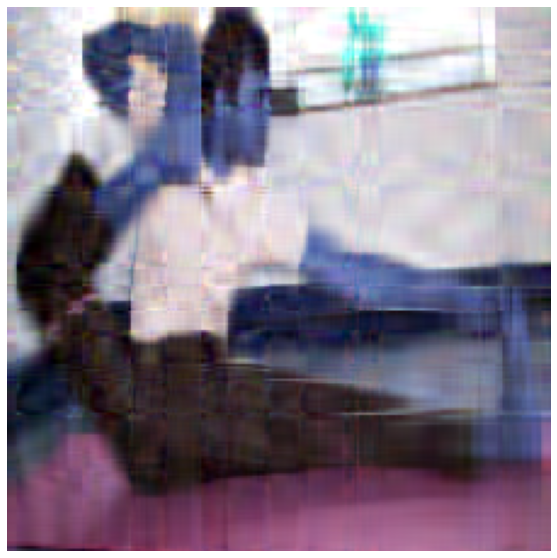

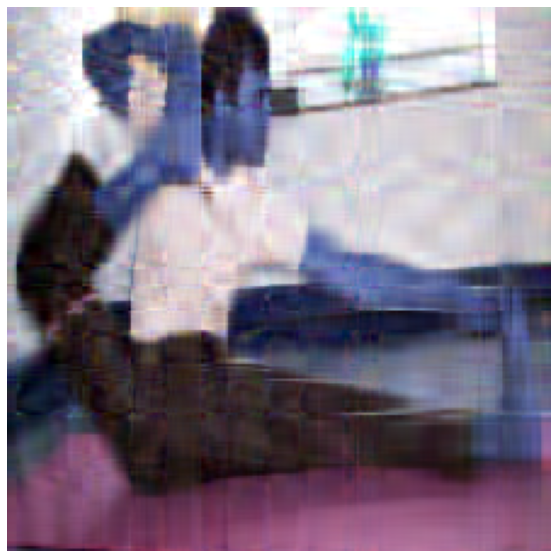

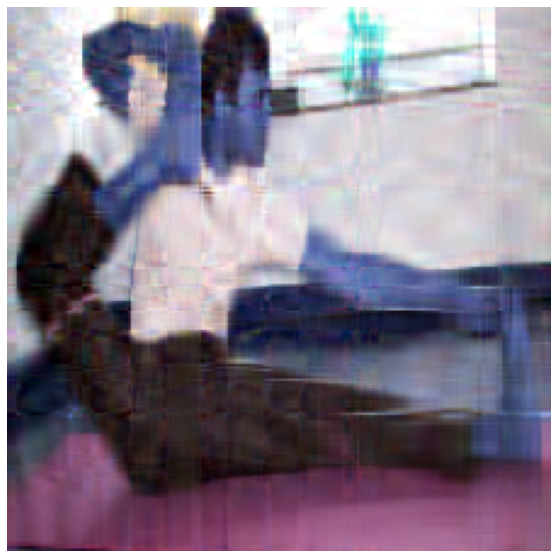

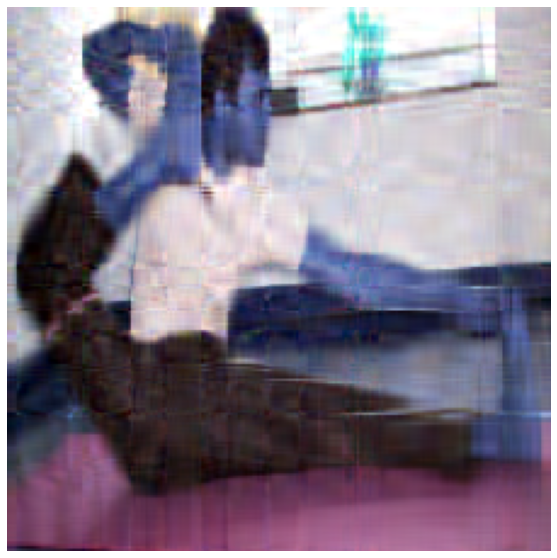

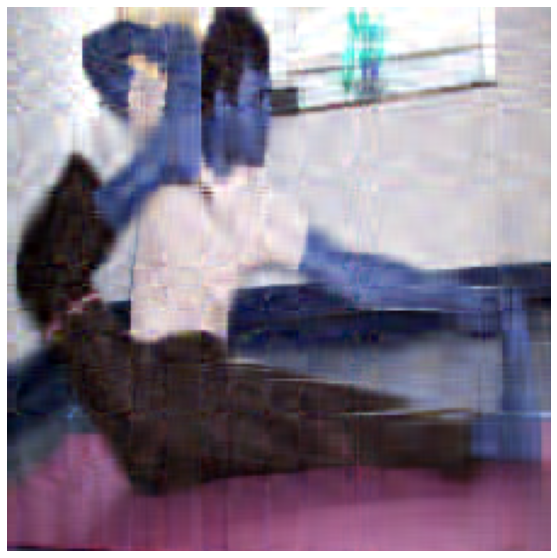

In [ ]:
for i in range(aproximaciones):
  x=np.dstack( (svd_aprox_rango_bajo_acumulada[0][i],  svd_aprox_rango_bajo_acumulada[1][i],svd_aprox_rango_bajo_acumulada[2][i]) )
  image = tf.expand_dims(x, 0)
  plt.figure(figsize=(10, 10))
  plt.imshow(image[0])
  plt.axis("off")


## Bootstrap

In [ ]:
for i in range(5):
  y_train_= 
  sub_X_train_b,sub_y_train=resample(X_train,y_train_, n_samples=X_train.shape[0]-200, replace=False, stratify=y_train_)

   _batch_size = 32 
    epocas= 100 #18 #test
    my_callbacks = [History(), EarlyStopping(patience=10, monitor="val_loss",restore_best_weights=True)]
    model.compile( loss=tf.keras.losses.CategoricalCrossentropy(),optimizer = tf.keras.optimizers.Adam(), metrics=['accuracy'])

    # Entrenar modelo
    history = model.fit(
        x = X_train_aumentado, #X_train,
        y = y_train, #y_train
        batch_size=_batch_size,
        epochs= epocas,
        verbose=2,
        validation_data=(X_val,y_val_2),  callbacks= my_callbacks
    )

    base_model.trainable = True


    # Freeze all the layers before the `fine_tune_at` layer
    for layer in base_model.layers[:52]:
      layer.trainable =  False

    model.compile(loss='categorical_crossentropy',
              optimizer = tf.keras.optimizers.Adam(lr=0.001/10),
              metrics=['accuracy'])
    
    fine_tune_epochs = 50
    total_epochs =  epocas + fine_tune_epochs
    #total_epochs = 18+16 #test
    my_callbacks = [History(), EarlyStopping(patience=5, monitor="val_loss",restore_best_weights=True)]

    history_fine = model.fit(x = X_train_aumentado, y = y_train , batch_size=_batch_size, #y_train
                            epochs=total_epochs,
                            initial_epoch=history.epoch[-1]
                            ,validation_data=(X_val,y_val_2), callbacks= my_callbacks)
    
    ypred=model.predict(X_val)
    y_val_real=[]
    for i in df.iloc[y_val_2.index].combinacion.values:
    #for i in y2[y_val.index]:
          y_val_real.append(list(y_val_2.columns).index(i))

    y_pred = np.argmax(ypred, axis=1)

    
                            

## CV

In [ ]:
%%time
kf = KFold(n_splits=3,shuffle=True,random_state=0)

errores=[]
#Total de --- modelos
_batch_size = 32 
fine_tune_epochs = 50
epocas= 100 #18 #test
#Probamos diferentes hiperparametros
regularización=[0,0.01,0.001]
p_drop=[0,0.1,0.2,0.3]

for train_index, val_index in kf.split(X):
    modelos=[]
    X_train, X_val = X[train_index], X[val_index]
    y_train, y_val = y.loc[train_index], y.loc[val_index]
    #Seran -- modelos. por cada distirbucion de datos que son -- distirbuciones distintas
    y_val_real=[]
    for i in df.iloc[y_val.index].combinacion.values:
          y_val_real.append(list(y_val.columns).index(i))
    ## Cantidad de imagenes que le faltan a la clase
    df_2 = df.iloc[y_train.index].reset_index() #validación

    max = df_2['combinacion'].value_counts().max()/2

    dic = {}
    lista= df_2['combinacion'].value_counts()

    for i in range(len(lista.index)):

      division = max//lista[i]
      resto = int(max%lista[i])
      if division-1 <0:
        division=1
      
      dic[lista.index[i]] = (int(division-1), resto )

    clases = list(dic.keys()) 

    y_train = list(y_train.idxmax(axis=1))

    for clase in clases: 
      n_rot, rot_solas = dic[clase]
      im=len(df_2[df_2['combinacion']==clase].index)
      for j in range(rot_solas):
          y_train=y_train+[clase]
      for i in range(n_rot*im):
        y_train=y_train+[clase]

    y_train =  pd.get_dummies(y_train)

    X_train_aumentado = np.concatenate((X_train, zoom(X_train)), axis=0) #validacion
    ##############################

    print('iterando')
    for p in p_drop:
        for r in regularización:

            base_model  = tf.keras.applications.DenseNet201(input_shape=(224,224,3),include_top=False, weights='imagenet') # cargamos con pesos entrenados en ImageNet

            base_model.trainable = False

            inputs = keras.Input(shape=(224, 224, 3))

            x = base_model(inputs, training=False)
            x = keras.layers.GlobalAveragePooling2D()(x)

            x = layers.Dense(256, activation='relu', activity_regularizer=L2(r))(x) 
            x= tf.keras.layers.Dropout(p)(x)
            x = layers.Dense(128, activation='relu', activity_regularizer=L2(r))(x)
            x= tf.keras.layers.Dropout(p)(x)
            output = layers.Dense(22, activation='softmax', name='MyOutput')(x)
            model = keras.Model(inputs=inputs, outputs=output, name='Second_FF')

      
            my_callbacks = [History(), EarlyStopping(patience=10, monitor="val_loss",restore_best_weights=True)]
            model.compile( loss=tf.keras.losses.CategoricalCrossentropy(),optimizer = tf.keras.optimizers.Adam(), metrics=['accuracy'])

            # Entrenar modelo
            history = model.fit(
                x = X_train_aumentado, #X_train,
                y = y_train, #y_train
                batch_size=_batch_size,
                epochs= epocas,
                verbose=0,
                validation_data=(X_val,y_val),  callbacks= my_callbacks
            )
            epocas= len(history.history['accuracy'])

            base_model.trainable = True
            # Fine-tune from this layer onwards
            fine_tune_at = 52 #107

            # Freeze all the layers before the `fine_tune_at` layer
            for layer in base_model.layers[:fine_tune_at]:
              layer.trainable =  False

            model.compile(loss='categorical_crossentropy',
              optimizer = tf.keras.optimizers.Adam(lr=0.001/10),
              metrics=['accuracy'])
            

            
            total_epochs =  epocas + fine_tune_epochs
            my_callbacks = [History(), EarlyStopping(patience=5, monitor="val_loss",restore_best_weights=True)]

            history_fine = model.fit(x = X_train_aumentado, y = y_train, batch_size=_batch_size, #y_train
                                    epochs=total_epochs,
                                    initial_epoch=history.epoch[-1],verbose=0
                                    ,validation_data=(X_val,y_val), callbacks= my_callbacks)

            ypred=model.predict(X_val)

            y_pred = np.argmax(ypred, axis=1)
            print(r,"-",p)

            
            modelos.append((f1_score(y_val_real, y_pred, average='macro'),r,p))

    errores.append(modelos) #Esta lista guardara todo los modelos para una distirbucion de datos en particular

iterando
0 - 0
0.01 - 0
0.001 - 0
0 - 0.1
0.01 - 0.1
0.001 - 0.1
0 - 0.2
0.01 - 0.2
0.001 - 0.2
0 - 0.3
0.01 - 0.3
0.001 - 0.3
iterando
0 - 0
0.01 - 0


In [ ]:
modelos

[]

In [ ]:
Promedios=list()
max_f1= 0.01
for i in range(len(errores)): #cantidad de modelos probados
    y=0
    for kfolds in errores:
        y+=kfolds[i][0]
    prom=y/5
    if prom >= max_f1:
        max_f1=prom
        i_max_f1=i
print('El mejor modelo con f1 ',max_f1,' , tiene parametros reg ',errores[0][i_max_f1][1],"y prob de drop ", errores[0][i_max_f1][1] )